source = https://www.kaggle.com/datasets/nehalbirla/vehicle-dataset-from-cardekho

In [366]:
import plotly.graph_objects as go
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.diagnostic import normal_ad
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
from scipy import stats
from scipy.special import inv_boxcox
import re

In [367]:
df = pd.read_csv("Car details v3.csv")
df

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0
8125,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0
8126,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [368]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   object 
 9   engine         7907 non-null   object 
 10  max_power      7913 non-null   object 
 11  torque         7906 non-null   object 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 825.6+ KB


I need to change few columns from string to numeric

In [369]:
df["make"] = df["name"].copy()

In [370]:
for i in range(len(df["name"])):
    df["make"][i] = df["name"][i].split()[0]

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\4140965466.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["make"][i] = df["name"][i].split()[0]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\4140965466.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["make"][i] = df["name"][i].split()[0]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\4140965466.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["make"][i] = df["n

In [371]:
df.drop("name", axis=1, inplace=True)

In [372]:
df["fuel"].unique()

array(['Diesel', 'Petrol', 'LPG', 'CNG'], dtype=object)

In [373]:
df["seller_type"].unique()

array(['Individual', 'Dealer', 'Trustmark Dealer'], dtype=object)

In [374]:
df["owner"].unique()

array(['First Owner', 'Second Owner', 'Third Owner',
       'Fourth & Above Owner', 'Test Drive Car'], dtype=object)

In [375]:
df["make"].unique()

array(['Maruti', 'Skoda', 'Honda', 'Hyundai', 'Toyota', 'Ford', 'Renault',
       'Mahindra', 'Tata', 'Chevrolet', 'Fiat', 'Datsun', 'Jeep',
       'Mercedes-Benz', 'Mitsubishi', 'Audi', 'Volkswagen', 'BMW',
       'Nissan', 'Lexus', 'Jaguar', 'Land', 'MG', 'Volvo', 'Daewoo',
       'Kia', 'Force', 'Ambassador', 'Ashok', 'Isuzu', 'Opel', 'Peugeot'],
      dtype=object)

In [376]:
df["transmission"].unique()

array(['Manual', 'Automatic'], dtype=object)

In [377]:
# there is a lot of cars
i = 0
for make in df["make"].unique():
    df["make"].replace(make, i, inplace=True)
    i += 1
df["make"].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31],
      dtype=int64)

In [378]:
df["fuel"].replace({'Diesel':0, 'Petrol':1, 'LPG':2, 'CNG':3}, inplace=True)
df["seller_type"].replace({'Individual':0, 'Dealer':1, 'Trustmark Dealer':2}, inplace=True)
df["owner"].replace({'First Owner':1, 'Second Owner':2, 'Third Owner':3, 'Fourth & Above Owner':4, 'Test Drive Car':0}, inplace=True)
df["seats"] = df["seats"].fillna(0).astype(int)
df["transmission"].replace({'Manual':0, 'Automatic':1}, inplace=True)

In [379]:
df

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,make
0,2014,450000,145500,0,0,0,1,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5,0
1,2014,370000,120000,0,0,0,2,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5,1
2,2006,158000,140000,1,0,0,3,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5,2
3,2010,225000,127000,0,0,0,1,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5,3
4,2007,130000,120000,1,0,0,1,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,1,0,0,1,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5,3
8124,2007,135000,119000,0,0,0,4,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5,3
8125,2009,382000,120000,0,0,0,1,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5,0
8126,2013,290000,25000,0,0,0,1,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5,8


### run code below twice

In [389]:
df["max_power"].fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)
for i in range(len(df["max_power"])):
    print(df["max_power"][i])
    if (type(df["max_power"][i]) is int) or (type(df["max_power"][i]) is float):
        continue
    if len(df["max_power"][i]) < 2:
        df["max_power"][i] = 0
    try:
        df["max_power"][i] = float(str(df["max_power"][i]).replace("bhp", "").strip())
    except:
        df["max_power"][i] = 0

74.0
103.52
78.0
90.0
88.2
81.86
57.5
37.0
67.1
68.1
108.45
60.0
73.9
67.0
82.0
88.5
90.0
46.3
88.73
64.1
98.6
74.0
88.8
83.81
83.1
47.3
73.8
67.0
34.2
88.5
35.0
81.83
88.5
40.3
67.1
121.3
67.0
138.03
37.0
160.77
117.3
116.3
83.14
88.5
67.05
168.5
100.0
120.7
98.63
175.56
98.6
103.25
98.6
171.5
100.6
174.33
138.03
187.74
170.0
88.8
78.9
88.76
74.0
86.8
83.1
108.495
98.6
67.0
108.62
88.5
88.5
78.9
74.0
168.5
74.0
93.7
103.6
100.6
98.59
189.0
67.04
67.05
47.3
47.3
68.05
35.0
58.2
74.0
68.05
103.6
67.1
82.85
74.0
82.0
46.3
88.73
67.05
90.0
81.8
73.0
83.1
120.0
94.68
121.3
160.0
65.0
155.0
69.01
126.32
88.76
138.1
67.04
88.5
83.14
67.04
83.8
126.2
98.96
73.9
67.0
67.04
46.3
88.76
62.1
88.76
86.7
188.0
214.56
177.0
280.0
148.31
254.79
187.74
190.0
177.46
204.0
141.0
117.6
138.03
190.0
241.4
88.5
282.0
150.0
147.5
177.0
108.5
103.6
147.5
103.5
183.0
93.7
181.04
116.3
81.8
67.05
81.8
171.5
108.5
190.0
157.7
190.0
164.7
91.1
400.0
103.6
86.8
68.0
81.8
67.0
81.83
37.0
73.9
82.0
75.0
82.0
85.8
8

In [390]:
df["engine"].fillna(0, inplace=True)
for i in range(len(df["engine"])):
    df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["engine"][i] = int(str(df["engine"][i]).replace("CC", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\2200817430.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [391]:
df["mileage"].fillna(0, inplace=True)
for i in range(len(df["mileage"])):
    try:
        df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
    except:
        df["mileage"][i] = 0

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\249983671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["mileage"][i] = float(str(df["mileage"][i]).replace("kmpl", "").strip())
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [392]:
for i in range(len(df["year"])):
    df["year"][i] = 2024 - df["year"][i]

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["year"][i]
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\1197834721.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["year"][i] = 2024 - df["ye

In [393]:
df

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,make
0,10,450000,145500,0,0,0,1,23.4,1248,74.0,190Nm@ 2000rpm,5,0
1,10,370000,120000,0,0,0,2,21.14,1498,103.52,250Nm@ 1500-2500rpm,5,1
2,18,158000,140000,1,0,0,3,17.7,1497,78.0,"12.7@ 2,700(kgm@ rpm)",5,2
3,14,225000,127000,0,0,0,1,23.0,1396,90.0,22.4 kgm at 1750-2750rpm,5,3
4,17,130000,120000,1,0,0,1,16.1,1298,88.2,"11.5@ 4,500(kgm@ rpm)",5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,11,320000,110000,1,0,0,1,18.5,1197,82.85,113.7Nm@ 4000rpm,5,3
7903,17,135000,119000,0,0,0,4,16.8,1493,110.0,"24@ 1,900-2,750(kgm@ rpm)",5,3
7904,15,382000,120000,0,0,0,1,19.3,1248,73.9,190Nm@ 2000rpm,5,0
7905,11,290000,25000,0,0,0,1,23.57,1396,70.0,140Nm@ 1800-3000rpm,5,8


In [394]:
df["torque"].fillna(0, inplace=True)
for i in range(len(df["torque"])):
    if df["torque"][i] == 0:
        continue
    df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["torque"][i] = float(re.findall(r'\d+\.?\d*', str(df["torque"][i]))[0])
C:\Users\Seba\AppData\Local\Temp\ipykernel_24716\3148822578.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [395]:
df = df.drop(df[(df[["max_power", "mileage", "torque", "engine"]] == 0).all(axis=1)].index)
df.reset_index(drop=True, inplace=True)
df

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,make
0,10,450000,145500,0,0,0,1,23.4,1248,74.0,190.0,5,0
1,10,370000,120000,0,0,0,2,21.14,1498,103.52,250.0,5,1
2,18,158000,140000,1,0,0,3,17.7,1497,78.0,12.7,5,2
3,14,225000,127000,0,0,0,1,23.0,1396,90.0,22.4,5,3
4,17,130000,120000,1,0,0,1,16.1,1298,88.2,11.5,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,11,320000,110000,1,0,0,1,18.5,1197,82.85,113.7,5,3
7903,17,135000,119000,0,0,0,4,16.8,1493,110.0,24.0,5,3
7904,15,382000,120000,0,0,0,1,19.3,1248,73.9,190.0,5,0
7905,11,290000,25000,0,0,0,1,23.57,1396,70.0,140.0,5,8


In [396]:
correlation_matrix = df[["make", "year", "selling_price", "km_driven", "fuel", "seller_type", "transmission", "owner", "mileage", "engine", "max_power", "torque", "seats"]].corr()

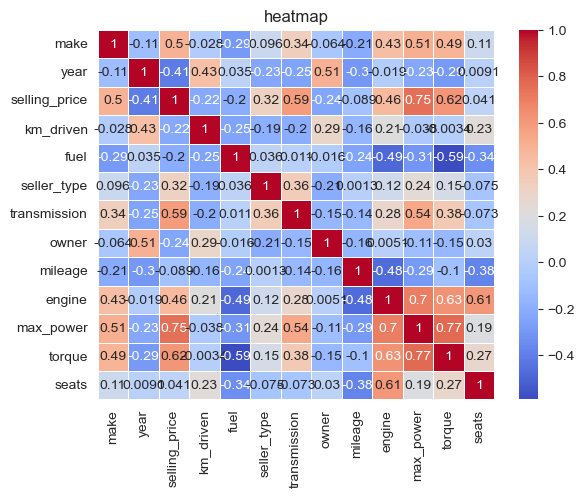

In [397]:
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("heatmap")
plt.show()

In [398]:
df.to_csv("car_deatils_for_ml_model.csv")

In [399]:
from sklearn.model_selection import train_test_split
y = df["selling_price"].copy()
x = df.copy()
x.drop(columns=["selling_price"], inplace=True)
print(x.head())

   year  km_driven  fuel  seller_type  transmission  owner mileage engine  \
0    10     145500     0            0             0      1    23.4   1248   
1    10     120000     0            0             0      2   21.14   1498   
2    18     140000     1            0             0      3    17.7   1497   
3    14     127000     0            0             0      1    23.0   1396   
4    17     120000     1            0             0      1    16.1   1298   

  max_power torque  seats  make  
0      74.0  190.0      5     0  
1    103.52  250.0      5     1  
2      78.0   12.7      5     2  
3      90.0   22.4      5     3  
4      88.2   11.5      5     0  


In [400]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

In [401]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [402]:
y_pred = model.predict(X_test)

In [403]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.6722204321958197